<a href="https://colab.research.google.com/github/vtecftwy/utseus-dives/blob/main/nbs/dive_5.2_images_with_stable_diffusion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Running Stable Diffusion to Create Images

This notebook shows examples of how you can use a stable diffusion model and generate images by giving it a text prompt.

We will use the `diffusers` package put together by Hugginface. Note that there other tools you can use as well. The sector is evolving very fast. Stable Diffusion from Stability AI was state of the art when it was released in Aug 2022, and stayed as the reference for a "long time". Now itis being overtaken by the commercial (and close source) models of OpenAI (DALLE) and MidJourney. But it keeps the advantage of being open source.

Like for any pretrained deep learning model, there are several versions and "endpoints". An endpoint refers to a particular model version trained with more or less data and offering increasing performances, even if they have the same features.

**Stable Diffusion Version 1**
- Stable Diffusion v1-1: Initial version trained on 194,000 steps at 512x512 resolution on LAION image dataset.
- Stable Diffusion v1-2: Same model, with training resumed from v1-1 with 515,000 steps at 512x512 resolution, on filtered LAION ds.
- Stable Diffusion v1-3: Another 195,000 steps training.
- Stable Diffusion v1-4: Further training from v1-2 with similar steps and dropout as v1-3.
- Stable Diffusion v1-5: Started again from 1-2, and trained another 595,000 steps, with an improved dataset (laion-aesthetics v2 5+).

**Stable Diffusion Version 2**
- Stable Diffusion v2-0: Introduced a new text encoder (OpenCLIP instead of CLIP) and produced images at 512x512 and 768x768 resolutions. It includes an inpainting model.
- Stable Diffusion v2-1: Fine-tuned from v2-0, available in 512x512 and 768x768 resolutions.

**Stable Diffusion XL (SDXL)**
- SDXL 1.0: The latest version with a larger architecture, including a larger UNet backbone, larger cross-attention context, and two text encoders. It supports multiple aspect ratios and includes a refiner model for adding fine details to images.


**Widely Recommended Versions**
- Stable Diffusion v1-4 and v1-5 offer a good balance of quality and performance/size. Easier to run.
- Stable Diffusion v2-1 is known for an improved image quality and higher resolution capabilities.
- Stable Diffusion XL (SDXL) offers the best image quality and flexibility but is much larger. It is used for professional and high-quality image generation tasks.

On Hugginface in June 2024, [`runwayml/stable-diffusion-v1-5`](https://huggingface.co/runwayml/stable-diffusion-v1-5) and then [`CompVis/stable-diffusion-v1-4`](https://huggingface.co/CompVis/stable-diffusion-v1-4) are the most downloaded.

Hugginface `diffuser` package gives us simple API to run this complex model: the [`DiffusionPipeline`](https://huggingface.co/docs/diffusers/main/en/api/pipelines/overview#diffusers.DiffusionPipeline). This is what we will use. The `DiffusionPipeline` takes care of bringing together all the parts: text encoder, UNet, VAE image decoder, scheduler, so that you can generate images.

We will start with generating images from text. Stable Diffusion also allows to generate images from other images and also to perform inpainting.

We will use the [`runwayml/stable-diffusion-v1-5`](https://huggingface.co/runwayml/stable-diffusion-v1-5) model.

# 🧰 Imports and configurations
Just run the cells in this section to get ready. Do not worry about the code here.

In [1]:
try:
    from diffusers import DiffusionPipeline
    import diffusers
except:
    print('need to install diffuser and other packages')
    ! pip install -qq diffusers transformers accelerate huggingface_hub
    print('all installed')
    from diffusers import DiffusionPipeline
    import diffusers

import torch
import warnings
from PIL import Image

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

need to install diffuser and other packages
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 54.1 MB/s eta 0:00:00
all installed


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)


In [2]:
from huggingface_hub import notebook_login
notebook_login()

# Load the model

First we pick the model,

In [63]:
# model_id = "CompVis/stable-diffusion-v1-4"
model_id = "runwayml/stable-diffusion-v1-5"
pipeline = DiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Now we will move the model's parameters onto the GPU to ensure good speed. We only can do that if you are awared a GPU of course.

In [64]:
pipeline = pipeline.to("cuda")

As we start from a random noise latent image, image generation is an inherently random process. But we also want to understand the effect of what we change in our prompt and parameters. Therefore, we often use a _random seed_. In these more complex systems, several parts need to be "seeded". This is why we will use a tool offered by pytorch, the [`Generator`](https://pytorch.org/docs/stable/generated/torch.Generator.html) and set a seed for [reproducibility](https://huggingface.co/docs/diffusers/main/en/./using-diffusers/reproducibility).

In [45]:
generator = torch.Generator("cuda").manual_seed(0)

Now you are ready to generate an images

# Image generation

The example prompt you'll use is a portrait of an old warrior chief, but feel free to use your own prompt:

In [65]:
prompt = "portrait photo of a old warrior chief"

## Generate one image at the time

We just give the prompt to the pipeline, together with the generator (which will make sure we generate the same image if we use teh same prompt twice)

  0%|          | 0/50 [00:00<?, ?it/s]

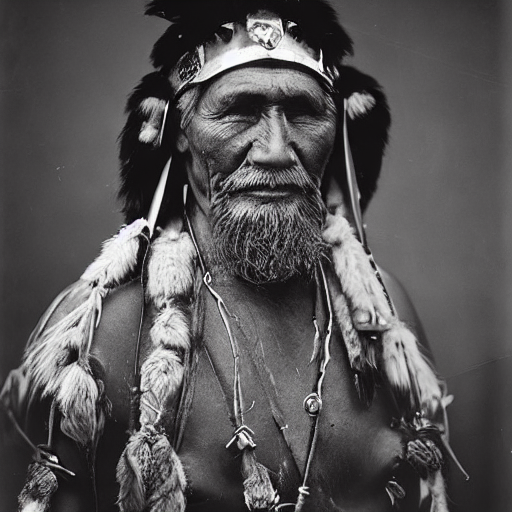

In [66]:
seed = 1988
generator = torch.Generator("cuda").manual_seed(seed)

image = pipeline(prompt, generator=generator).images[0]
image

This process took ~30 seconds on a T4 GPU (it might be faster if your allocated GPU is better than a T4).

You may have noticed that the image generation went through 50 steps. Our scheduler took out noice from the initial image in 50 steps.

We have not defined any specific scheduler, which means the pipeline took the default scheduler: [PNDMScheduler](https://huggingface.co/docs/diffusers/main/en/api/schedulers/pndm#diffusers.PNDMScheduler) which usually requires ~50 inference steps.

In [67]:
pipeline.scheduler

PNDMScheduler {
  "_class_name": "PNDMScheduler",
  "_diffusers_version": "0.29.1",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "timestep_spacing": "leading",
  "trained_betas": null
}

You can find any schedulers out of a list of compatible ones. We can find out which scheduler is compatibal with the `compatibles` method:

In [68]:
pipeline.scheduler.compatibles

[diffusers.schedulers.scheduling_deis_multistep.DEISMultistepScheduler,
 diffusers.utils.dummy_torch_and_torchsde_objects.DPMSolverSDEScheduler,
 diffusers.schedulers.scheduling_edm_euler.EDMEulerScheduler,
 diffusers.schedulers.scheduling_lms_discrete.LMSDiscreteScheduler,
 diffusers.schedulers.scheduling_dpmsolver_singlestep.DPMSolverSinglestepScheduler,
 diffusers.schedulers.scheduling_ddpm.DDPMScheduler,
 diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler,
 diffusers.schedulers.scheduling_k_dpm_2_discrete.KDPM2DiscreteScheduler,
 diffusers.schedulers.scheduling_heun_discrete.HeunDiscreteScheduler,
 diffusers.schedulers.scheduling_pndm.PNDMScheduler,
 diffusers.schedulers.scheduling_k_dpm_2_ancestral_discrete.KDPM2AncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_unipc_multistep.UniPCMultistepScheduler,
 diffusers.schedulers.scheduling_euler_ancestral_discrete.EulerAncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_ddim.DDIMScheduler

For Stable Diffusion v1.5, the recommended and most commonly used schedulers are:
- **PNDM Scheduler (default)**: The PNDM (Predicted Noise Denoising Diffusion Gaussian Mixture) scheduler is the default scheduler used by Stable Diffusion v1.5. It provides a good balance between quality and speed.
- LMSDiscreteScheduler: The LMSDiscreteScheduler (Linear Multistep Scheduler) typically generates higher quality images than the default PNDM scheduler, but is slower.
- EulerDiscreteScheduler: The EulerDiscreteScheduler is a fast scheduler that can produce decent quality images, though not as high as LMS.
- **DPMSolverMultistepScheduler**: The DPMSolverMultistepScheduler is another high quality scheduler, but tends to be quite slow.

The last one, [DPMSolverMultistepScheduler](https://huggingface.co/docs/diffusers/main/en/api/schedulers/multistep_dpm_solver#diffusers.DPMSolverMultistepScheduler) typically only requires  ~20 or 25 inference steps.

Let's change it.

In [70]:
from diffusers import DPMSolverMultistepScheduler

pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)

Now set the `num_inference_steps` to 20:

  0%|          | 0/20 [00:00<?, ?it/s]

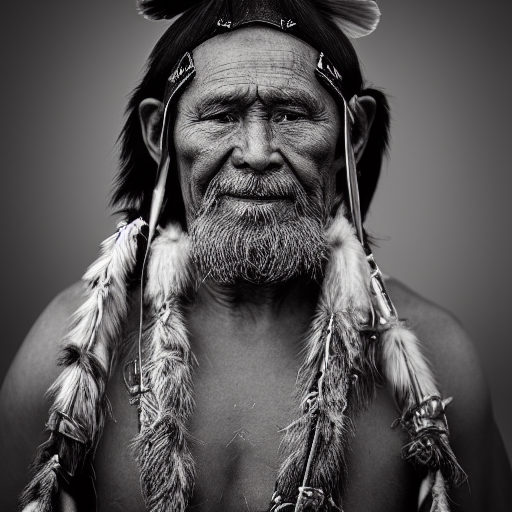

In [71]:
generator = torch.Generator("cuda").manual_seed(seed)
image = pipeline(prompt, generator=generator, num_inference_steps=20).images[0]
image

Great, you've managed to cut the inference time to less then 5 seconds! ⚡️

## Generate several images at the same time

Depending on how much memory our GPU has, we can increase the number of generated images to 2, 4, 8 ... If we are too ambitious, we will get a Out of Memory (OOM) error.

Let's create a function that will generate the parameters to pass to `pipeline` for a **batch** of images from a **list of prompts**.

In [75]:
def get_inputs(prompt, batch_size=1, seed=seed):
    # Repeat the prompt for each image we want to generate
    prompts = batch_size * [prompt]
    # create a generator for each image
    generator = [torch.Generator("cuda").manual_seed(seed + i) for i in range(batch_size)]
    num_inference_steps = 20
    kwargs_for_pipeline = {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}
    return kwargs_for_pipeline

You will also need a function to display each batch of images:

In [76]:
def image_grid(imgs, rows=2, cols=2):
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

Start with `batch_size=4` and see how much memory you've consumed:

  0%|          | 0/20 [00:00<?, ?it/s]

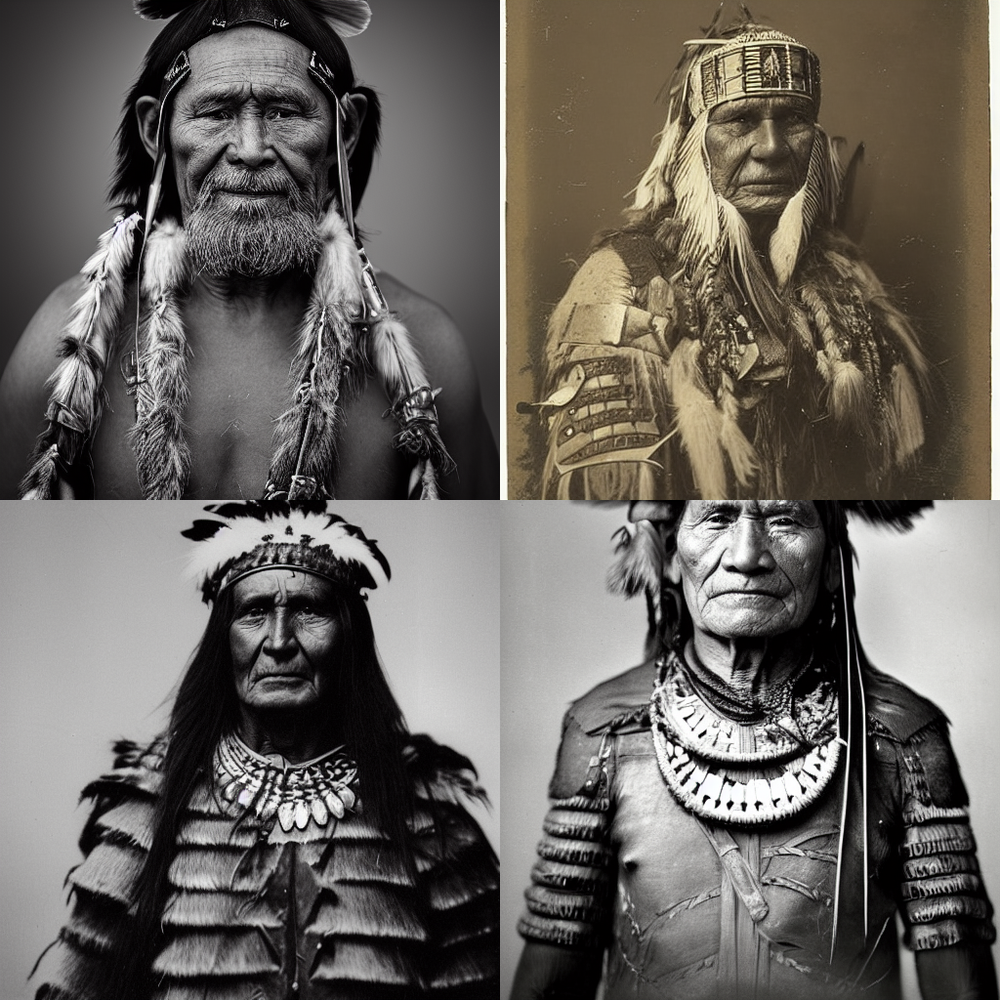

In [77]:
bs = 4
images = pipeline(**get_inputs(prompt, batch_size=bs)).images
image_grid(images, rows=2, cols=2)

Note:
> Most of the memory in the model is taken up by the cross-attention layers between text latents and image latents. To save memory, it is possible to run this operation not as a batch, but sequentially. It saves a significant amount of memory. But it will take longer.
>
> To do so, you must configure the pipeline to use the [enable_attention_slicing()](https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion/upscale#diffusers.StableDiffusionUpscalePipeline.enable_attention_slicing) function:

In [78]:
pipeline.enable_attention_slicing()

Now try increasing the `batch_size`

  0%|          | 0/20 [00:00<?, ?it/s]

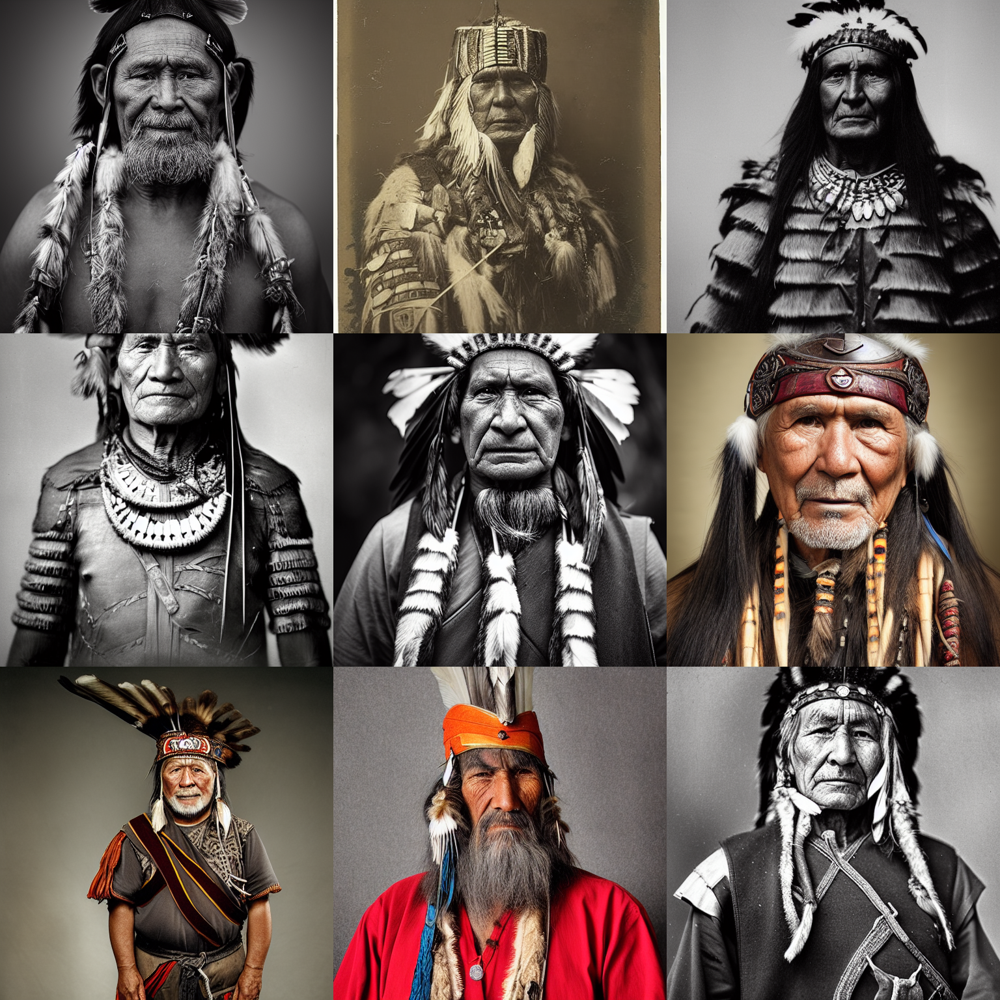

In [80]:
bs = 9
images = pipeline(**get_inputs(prompt, batch_size=bs)).images
image_grid(images, rows=3, cols=3)

# Prompt engineering

The text prompt you use to generate an image is super important, so much so that it is called *prompt engineering*. Some considerations to keep during prompt engineering are:

- How is the image or similar images of the one I want to generate stored on the internet?
- What additional detail can I give that steers the model towards the style I want?

With this in mind, let's improve the prompt to include color and higher quality details:

In [81]:
prompt = "portrait photo of a old warrior chief"
prompt += ", tribal panther make up, blue on red, side profile, looking away, serious eyes"
prompt += " 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta"

Generate a batch of images with the new prompt:

  0%|          | 0/20 [00:00<?, ?it/s]

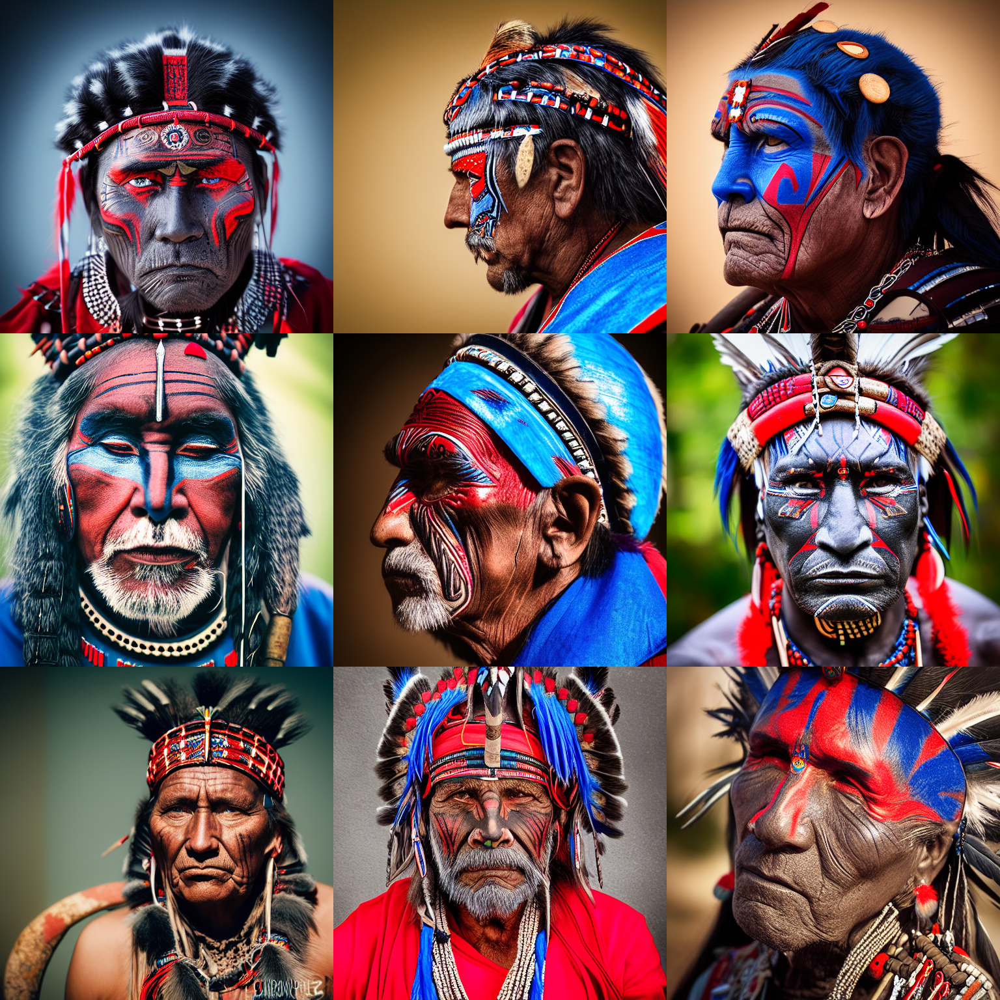

In [82]:
bs = 9
images = pipeline(**get_inputs(prompt, batch_size=bs)).images
image_grid(images, rows=3, cols=3)

Pretty impressive! Let's tweak the second image - corresponding to the `Generator` with a seed of `1` - a bit more by adding some text about the age of the subject:

  0%|          | 0/25 [00:00<?, ?it/s]

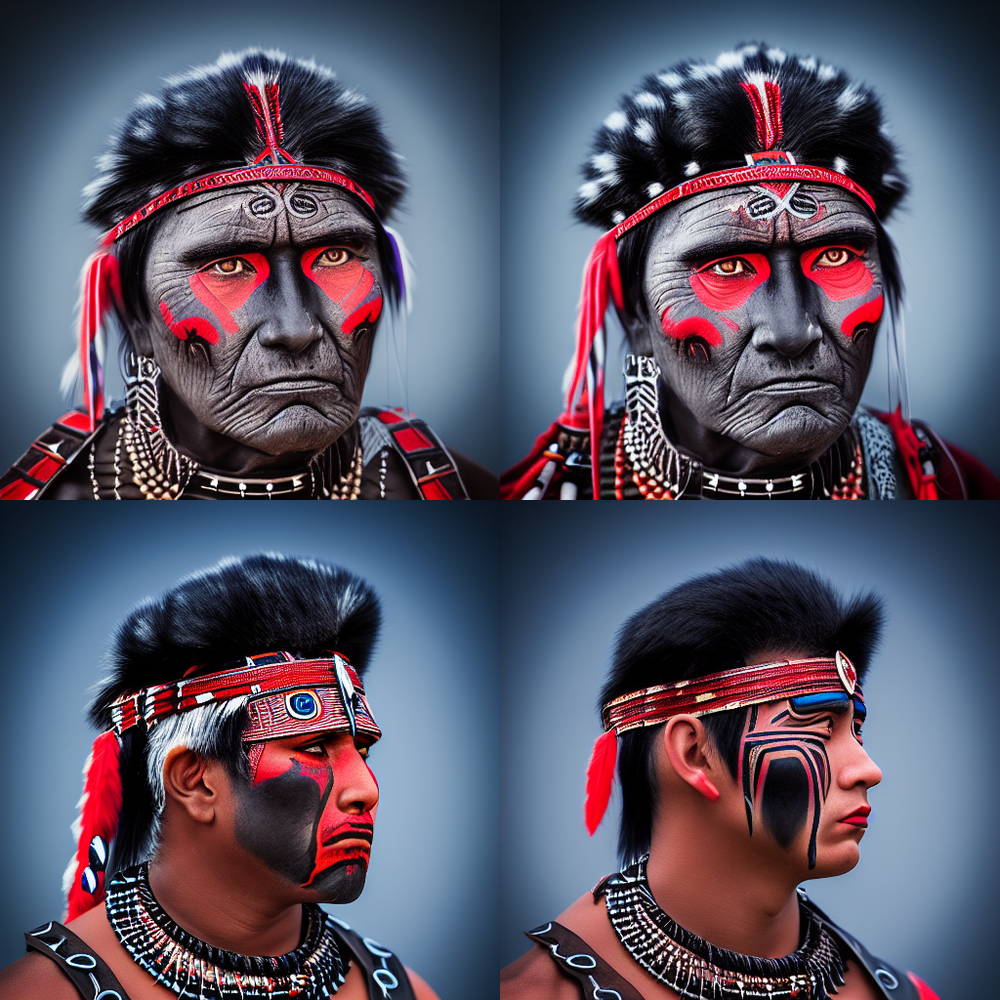

In [84]:
prompts = [
    "portrait photo of the oldest warrior chief, tribal panther make up, blue on red, side profile, looking away, serious eyes 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta",
    "portrait photo of a old warrior chief, tribal panther make up, blue on red, side profile, looking away, serious eyes 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta",
    "portrait photo of a warrior chief, tribal panther make up, blue on red, side profile, looking away, serious eyes 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta",
    "portrait photo of a young warrior chief, tribal panther make up, blue on red, side profile, looking away, serious eyes 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta",
]
generator = [torch.Generator("cuda").manual_seed(seed) for _ in range(len(prompts))]

images = pipeline(prompt=prompts, generator=generator, num_inference_steps=25).images
image_grid(images)

# Now you can copy the code and create your own images

Do not forget:
- a prompt as a `string`
- a generator per prompt
- run the pipeline and present the images

You can change the seed to see a "style" you like. Then you can change the prompt to fine tune your image.